In [53]:
from data_util import load_image, get_patch
from generators import PatchGenerator#, PatchSequence
# from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
# from network import create_model
from os.path import join
# from skimage.transform import rotate
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import KFold
# import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from pylab import boxplot
# import keras.backend as K
# import keras
import numpy as np
import pandas as pd
from tqdm import tqdm

In [3]:
!git add .

^C


In [113]:
def test_get_patch(image, coord, size=(70, 70, 40), shifted=True):
    '''
    Function that returns a fixed sized patch, centered around a coordinate,
    from a given numpy array.
    Note: The input coordinates should be a tuple in (y, x, z) format.
    '''
    if type(size) == int:
        size = (size, size, size)
    
    patch  = np.zeros((size[1], size[0], size[2])) # numpy array of the patch
    offset = (size[1]//2, size[0]//2, size[2]//2) # offset
    
    #image = np.pad(image, 30, 'constant')
    
    coordinates = np.array(list(coord))        # list of coordinates
    img_shape   = np.array(image.shape)        # shape of the image
    
    # change representation (x,y,z) to (y,x,z) 
    img_shape[[0,1,2]] = img_shape[[1,0,2]]
    coordinates[[0,1,2]] = coordinates[[1,0,2]]
    
    # for each dimension shift the coordinates (only if needed)
    if shifted is True:
        for i in range(3):
            print(coordinates[i], offset[i])
            if coordinates[i] + offset[i] >= img_shape[i]:
                if size[i] % 2 != 0:
                    coordinates[i] = img_shape[i] - offset[i] - 1
                else:
                    coordinates[i] = img_shape[i] - offset[i]

            if coordinates[i] - offset[i] < 0:
                coordinates[i] = 0 + offset[i]

    # get the coordinates
    x, y, z = coordinates
        
    # Define start point and padding size before start
    xstart = x-offset[0]
    xpad = max(0, xstart-(x-offset[0]))
    ystart = y-offset[1]
    ypad = max(0, ystart-(y-offset[1]))
    zstart = z-offset[2]
    zpad = max(0, zstart-(z-offset[2]))

    # Copy image over patch
    for i in range(size[1]):
        x = xstart+i
        for j in range(size[0]):
            y = ystart+j
            for k in range(size[2]):
                z = zstart+k
                if x>image.shape[0]-1 or y>image.shape[1]-1 or z>image.shape[2]-1: # to big, so needs padding
                    patch[i,j,k]=0
                elif x < xpad or y < ypad or z < zpad:
                    patch[i,j,k]=0
                else:
                    patch[i,j,k] = image[x,y,z]
    
    return np.expand_dims(patch, -1)
        

In [114]:
print(test_get_patch(np.arange(1000).reshape(10,10,10), (8,1,8), (1,5,9), False))
print(range(2,8)[2])

0 1 -1 0
[[[[   0.]
   [   0.]
   [   0.]
   [   0.]
   [   0.]
   [   0.]
   [   0.]
   [   0.]
   [   0.]]]


 [[[  84.]
   [  85.]
   [  86.]
   [  87.]
   [  88.]
   [  89.]
   [   0.]
   [   0.]
   [   0.]]]


 [[[ 184.]
   [ 185.]
   [ 186.]
   [ 187.]
   [ 188.]
   [ 189.]
   [   0.]
   [   0.]
   [   0.]]]


 [[[ 284.]
   [ 285.]
   [ 286.]
   [ 287.]
   [ 288.]
   [ 289.]
   [   0.]
   [   0.]
   [   0.]]]


 [[[ 384.]
   [ 385.]
   [ 386.]
   [ 387.]
   [ 388.]
   [ 389.]
   [   0.]
   [   0.]
   [   0.]]]]
4


In [49]:
def augf(img, cut=True):
    if np.random.random() > .5:
        tmp = np.squeeze(img)
        angle = np.random.uniform(0, 90)
#         tmp = rotate(tmp, angle)
        img = np.expand_dims(tmp, -1)
    if np.random.random() > .5:
        img = np.fliplr(img)
    if np.random.random() > .5:
        img = np.flipud(img)
    if cut:
        return img[15:55, 15:55, :] 
    return img

In [4]:
!ls ..

ISMI-Project  assignment_4  assignment_6  assignment_8
assignment_2  assignment_5  assignment_7


In [50]:
csv = pd.read_csv(join('/projects/0/ismi2018/FINALPROJECTS/BREAST_3D_ULTRASOUND/shareWithStudents/', 'trainingSet.csv'), dtype=str)
batch_size = 30

In [51]:
unique_patients = csv.patientID.unique()
kf = KFold(5, shuffle=True, random_state=42)

In [ ]:
accuracies = []
for i, (train_patients_idxs, val_patients_idxs) in enumerate(kf.split(unique_patients), start=1):
    print('Training fold {}'.format(i))
    
    train_patients = unique_patients[train_patients_idxs]
    val_patients = unique_patients[val_patients_idxs]
    
    train_csv = csv.loc[csv['patientID'].isin(train_patients), :]
    val_csv = csv.loc[csv['patientID'].isin(val_patients), :]
    
    training_gen = PatchGenerator(
        input_dir='./data',
        dataframe=train_csv,
        batch_size=batch_size,
        augmentation_fn=augf
    )
    
    # Print label balance
    print(train_csv.groupby('histology').histology.count())

    valid_seq = PatchSequence(
        input_dir='./data',
        dataframe=val_csv,
        batch_size=batch_size
    )
    
    print(val_csv.groupby('histology').histology.count())
    
    net = create_model(patch_size=40, optimizer='adam', metrics='accuracy')
    save_path = 'first_model_fold_{}.h5'.format(i)
    cp = ModelCheckpoint(save_path, monitor='val_acc', save_best_only=True)
    lr = ReduceLROnPlateau(monitor='val_acc', factor=.5, min_lr=1e-6, patience=5)
    history = net.fit_generator(training_gen,
                                validation_data=valid_seq,
                                steps_per_epoch=len(training_gen)*5,
                                epochs=30,
                                use_multiprocessing=True,
                                workers=4,
                                callbacks=[cp, lr])
    # Plot training history
    plt.figure()
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['acc', 'val_acc', 'loss', 'val_loss'])
    plt.show()
    
    # Plot confusion matrix
    y_true = valid_seq.get_all_labels()
    y_true[y_true == 2] = 0
    y_true[y_true == 20] = 1
    y_true[y_true == 21] = 2
    best_model = keras.models.load_model(save_path)
    y_pred = best_model.predict_generator(valid_seq,
                                          use_multiprocessing=True,
                                          workers=4)
    y_pred = np.argmax(y_pred, axis=1)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True)
    plt.show()
    
    # Store fold accuracy
    accuracies.append(accuracy_score(y_true, y_pred))

print('Mean accuracy: {:.4f}'.format(np.mean(accuracies)))

20 101 81 0
label: 21
x: 101, y: 142, z: 21


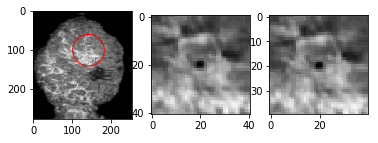

20 66 46 0
label: 21
x: 66, y: 108, z: 21


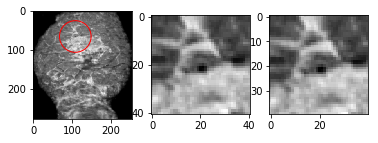

20 126 106 0
label: 21
x: 126, y: 160, z: 18


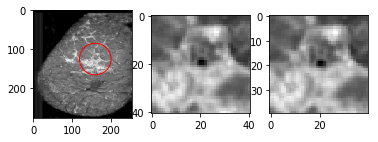

20 140 120 0
label: 2
x: 140, y: 171, z: 24


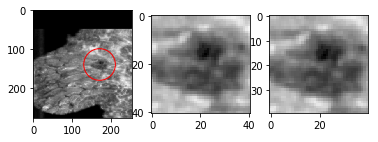

20 164 144 0
label: 2
x: 164, y: 180, z: 12


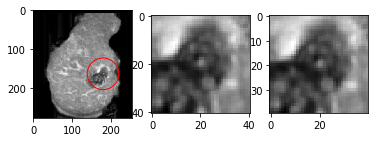

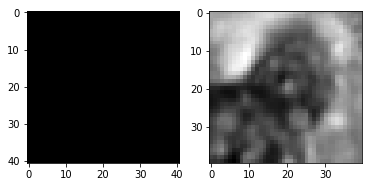

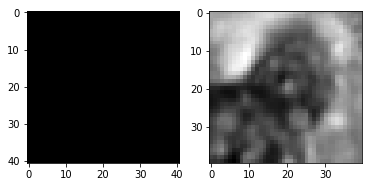

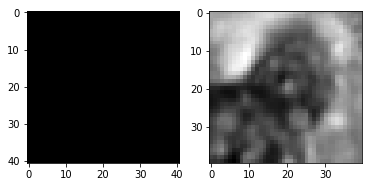

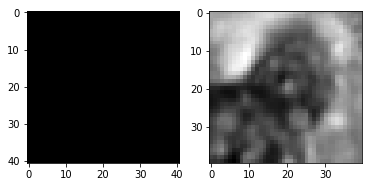

...

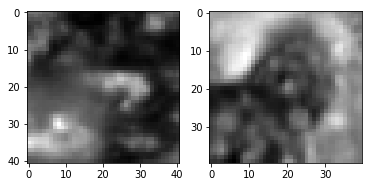

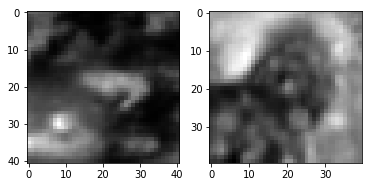

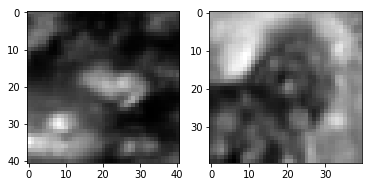

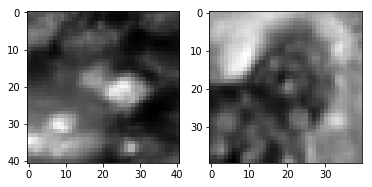

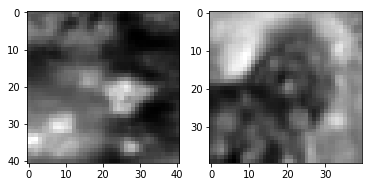

20 84 64 0
label: 21
x: 84, y: 136, z: 24


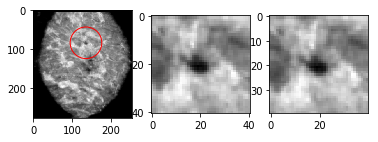

20 102 82 0
label: 21
x: 102, y: 38, z: 36


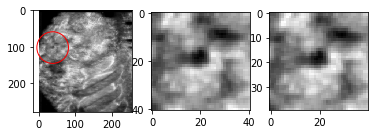

20 114 94 0
label: 21
x: 114, y: 219, z: 30


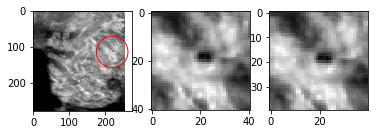

20 205 185 0
label: 2
x: 205, y: 179, z: 12


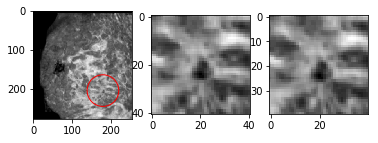

20 191 171 0
label: 2
x: 191, y: 181, z: 23


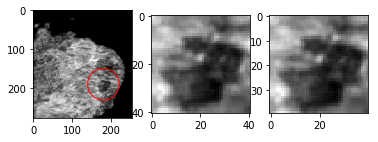

20 236 216 0
label: 2
x: 236, y: 81, z: 21


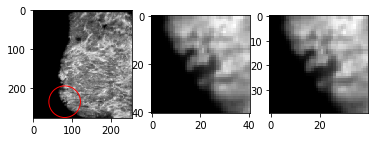

20 8 -12 0
label: 2
x: 8, y: 105, z: 18


/hpc/sw/python-3.5.2/lib/python3.5/site-packages/matplotlib/axes/_base.py:3193: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


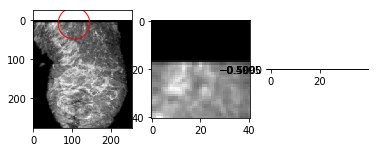

20 186 166 0
label: 2
x: 186, y: 5, z: 28


/hpc/sw/python-3.5.2/lib/python3.5/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=-0.5, right=-0.5
  'left=%s, right=%s') % (left, right))


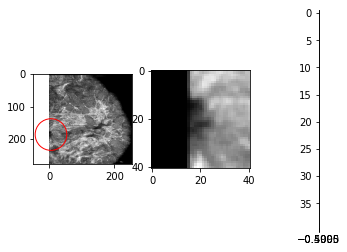

20 88 68 0
label: 21
x: 88, y: 56, z: 14


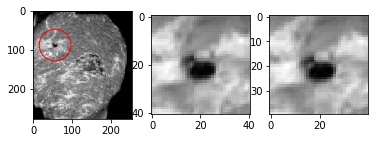

20 77 57 0
label: 21
x: 77, y: 90, z: 22


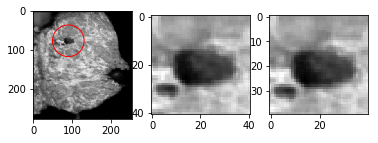

20 156 136 0
label: 2
x: 156, y: 147, z: 39


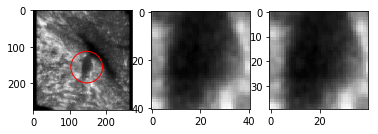

20 93 73 0
label: 21
x: 93, y: 139, z: 22


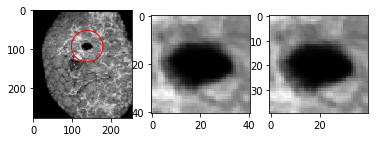

20 36 16 0
label: 2
x: 36, y: 87, z: 36


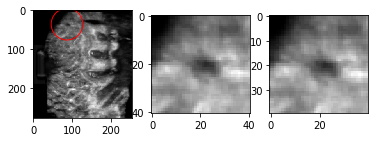

20 124 104 0
label: 2
x: 124, y: 171, z: 30


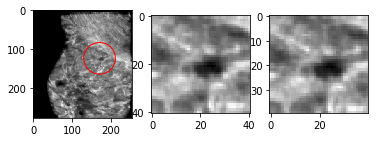

20 227 207 0
label: 2
x: 227, y: 152, z: 19


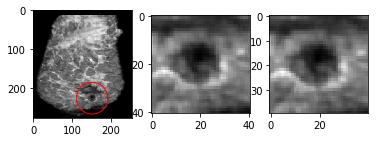

20 200 180 0
label: 2
x: 200, y: 111, z: 15


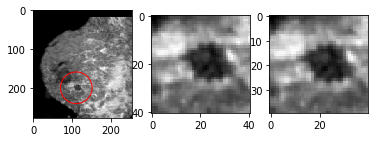

20 94 74 0
label: 2
x: 94, y: 120, z: 22


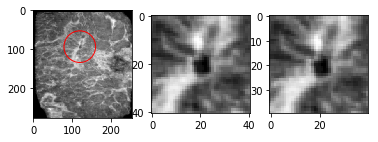

20 80 60 0
label: 21
x: 80, y: 107, z: 36


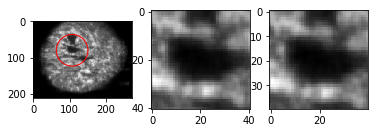

20 131 111 0
label: 2
x: 131, y: 148, z: 28


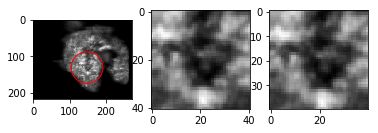

20 132 112 0
label: 21
x: 132, y: 112, z: 6


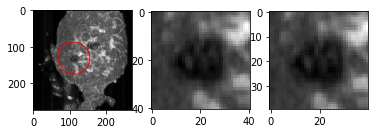

20 228 208 0
label: 2
x: 228, y: 238, z: 23


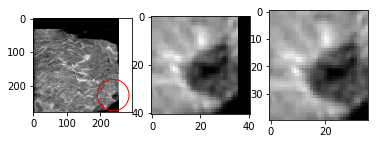

20 166 146 0
label: 21
x: 166, y: 112, z: 27


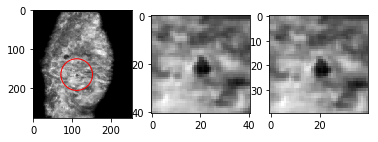

20 96 76 0
label: 2
x: 96, y: 136, z: 21


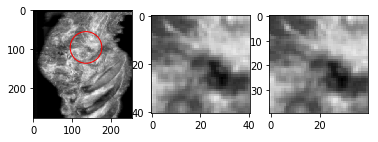

20 107 87 0
label: 2
x: 107, y: 168, z: 35


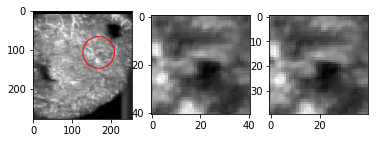

20 43 23 0
label: 21
x: 43, y: 220, z: 27


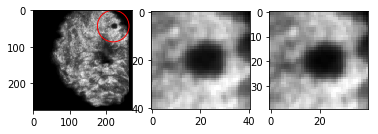

20 86 66 0
label: 2
x: 86, y: 126, z: 31


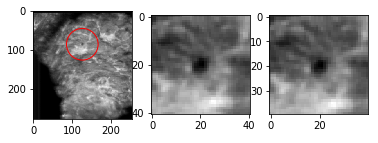

20 135 115 0
label: 2
x: 135, y: 69, z: 13


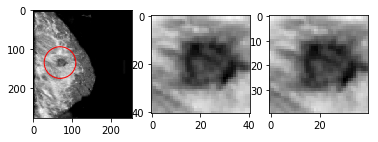

20 53 33 0
label: 2
x: 53, y: 160, z: 59


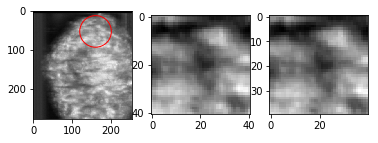

20 130 110 0
label: 21
x: 130, y: 112, z: 23


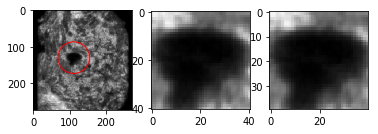

20 90 70 0
label: 21
x: 90, y: 134, z: 30


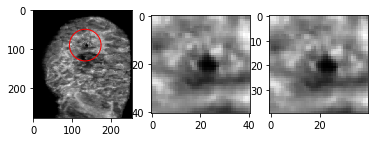

20 97 77 0
label: 21
x: 97, y: 203, z: 30


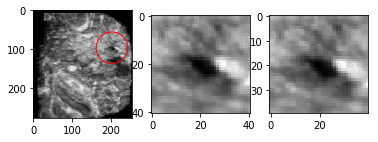

20 167 147 0
label: 21
x: 167, y: 113, z: 30


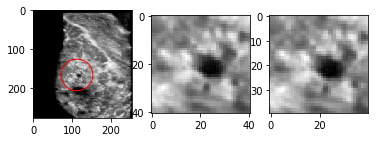

20 63 43 0
label: 21
x: 63, y: 154, z: 30


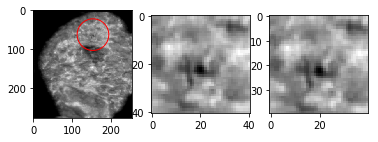

20 123 103 0
label: 21
x: 123, y: 167, z: 24


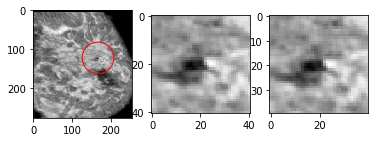

20 93 73 0
label: 21
x: 93, y: 105, z: 30


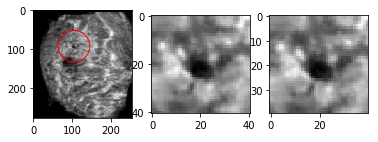

20 103 83 0
label: 21
x: 103, y: 141, z: 30


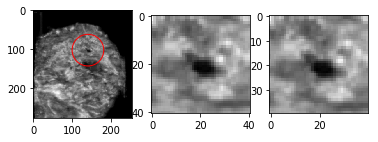

20 81 61 0
label: 21
x: 81, y: 150, z: 26


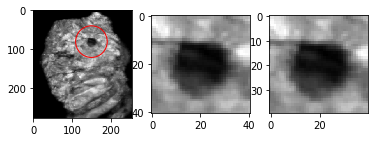

20 96 76 0
label: 21
x: 96, y: 67, z: 30


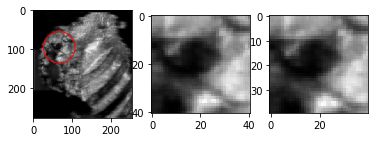

20 106 86 0
label: 2
x: 106, y: 103, z: 21


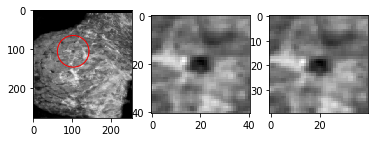

20 105 85 0
label: 2
x: 105, y: 103, z: 24


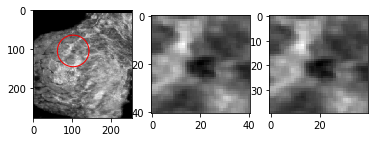

20 28 8 0
label: 21
x: 28, y: 231, z: 33


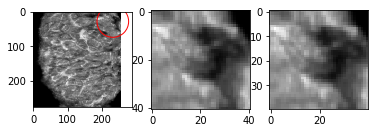

20 156 136 0
label: 20
x: 156, y: 77, z: 27


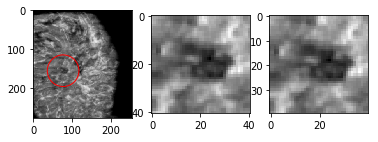

20 123 103 0
label: 2
x: 123, y: 114, z: 27


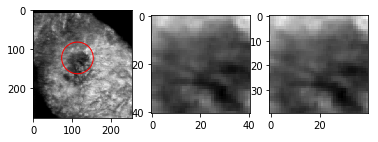

20 87 67 0
label: 2
x: 87, y: 137, z: 30


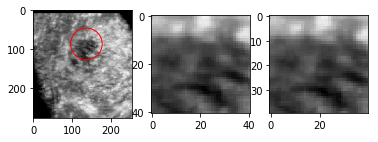

20 117 97 0
label: 2
x: 117, y: 58, z: 31


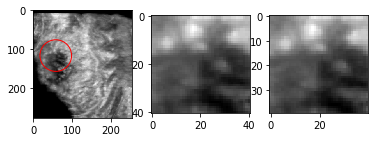

20 191 171 0
label: 2
x: 191, y: 204, z: 25


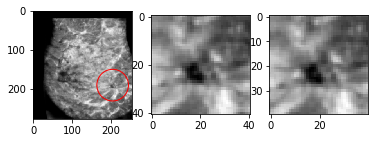

20 208 188 0
label: 2
x: 208, y: 154, z: 24


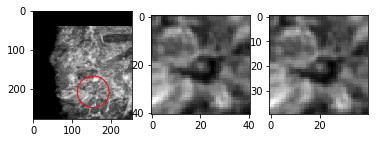

20 144 124 0
label: 2
x: 144, y: 116, z: 21


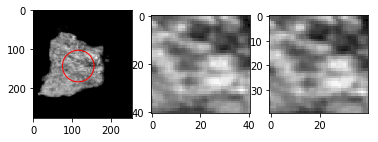

20 168 148 0
label: 2
x: 168, y: 83, z: 17


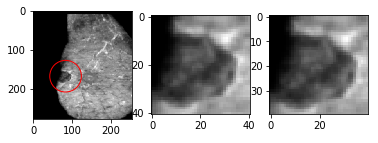

20 135 115 0
label: 2
x: 135, y: 149, z: 16


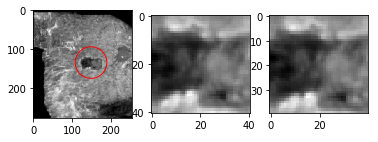

20 115 95 0
label: 21
x: 115, y: 145, z: 22


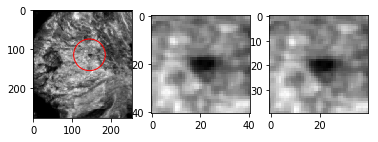

20 213 193 0
label: 21
x: 213, y: 73, z: 24


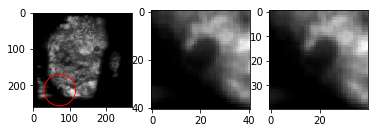

20 67 47 0
label: 2
x: 67, y: 114, z: 25


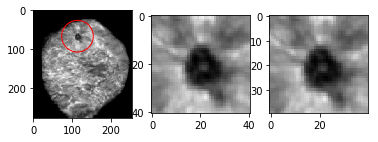

20 180 160 0
label: 2
x: 180, y: 134, z: 15


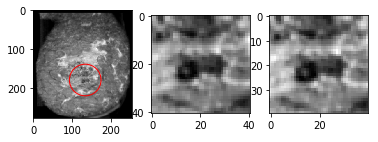

20 188 168 0
label: 2
x: 188, y: 184, z: 23


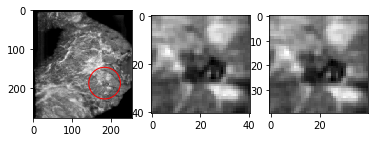

20 203 183 0
label: 2
x: 203, y: 26, z: 23


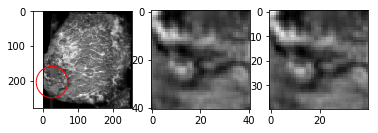

20 203 183 0
label: 2
x: 203, y: 40, z: 29


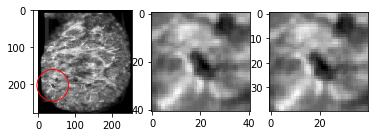

20 188 168 0
label: 2
x: 188, y: 184, z: 25


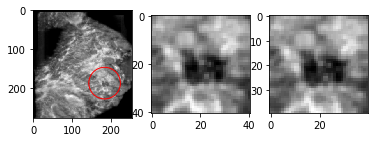

20 205 185 0
label: 2
x: 205, y: 21, z: 25


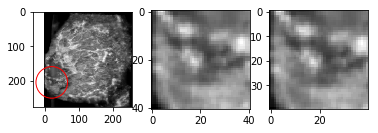

20 67 47 0
label: 2
x: 67, y: 209, z: 33


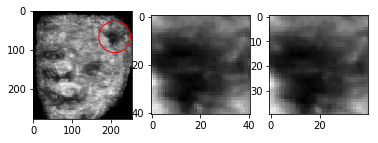

20 86 66 0
label: 2
x: 86, y: 52, z: 24


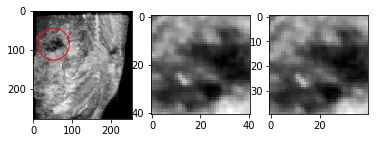

20 123 103 0
label: 21
x: 123, y: 162, z: 35


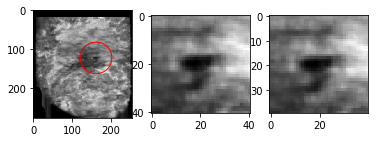

20 71 51 0
label: 2
x: 71, y: 208, z: 34


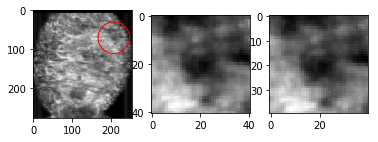

20 68 48 0
label: 2
x: 68, y: 45, z: 30


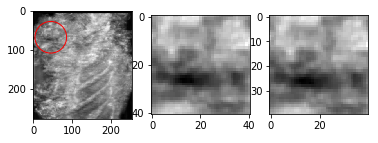

20 156 136 0
label: 2
x: 156, y: 207, z: 31


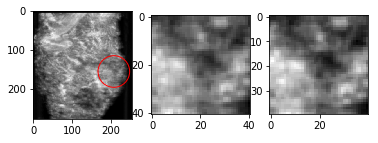

20 139 119 0
label: 21
x: 139, y: 194, z: 17


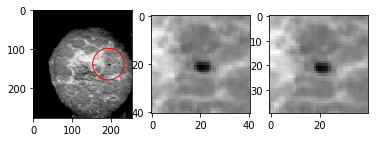

20 174 154 0
label: 21
x: 174, y: 106, z: 18


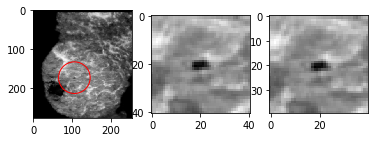

20 70 50 0
label: 2
x: 70, y: 148, z: 44


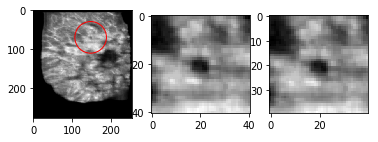

20 127 107 0
label: 2
x: 127, y: 195, z: 44


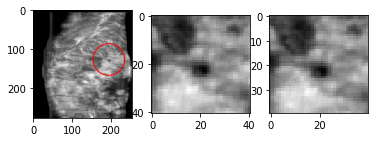

20 87 67 0
label: 2
x: 87, y: 134, z: 45


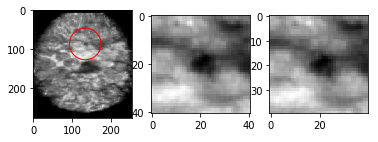

20 176 156 0
label: 2
x: 176, y: 137, z: 37


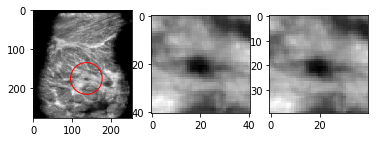

20 79 59 0
label: 20
x: 79, y: 171, z: 18


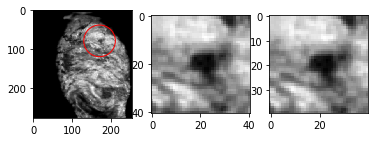

20 122 102 0
label: 20
x: 122, y: 110, z: 18


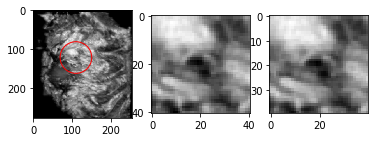

20 97 77 0
label: 20
x: 97, y: 172, z: 14


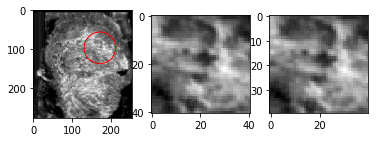

20 92 72 0
label: 20
x: 92, y: 132, z: 16


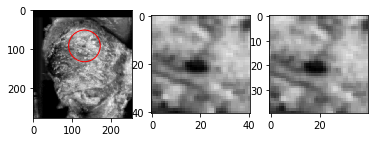

20 90 70 0
label: 20
x: 90, y: 196, z: 16


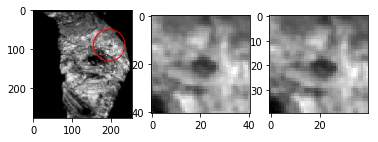

20 109 89 0
label: 20
x: 109, y: 164, z: 18


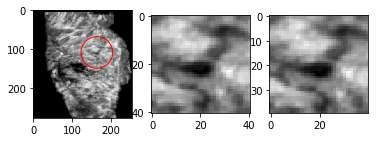

20 136 116 0
label: 20
x: 136, y: 138, z: 14


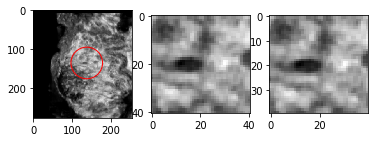

20 106 86 0
label: 20
x: 106, y: 159, z: 12


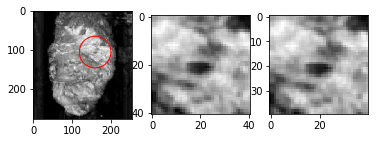

20 95 75 0
label: 20
x: 95, y: 175, z: 14


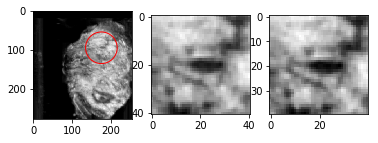

20 139 119 0
label: 2
x: 139, y: 26, z: 12


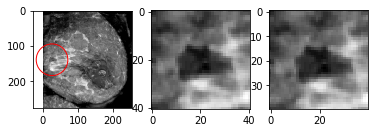

20 151 131 0
label: 2
x: 151, y: 132, z: 12


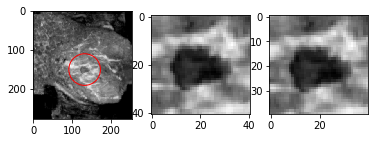

20 147 127 0
label: 21
x: 147, y: 98, z: 20


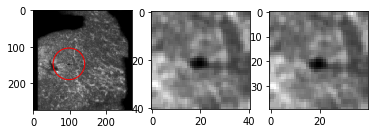

20 96 76 0
label: 21
x: 96, y: 119, z: 15


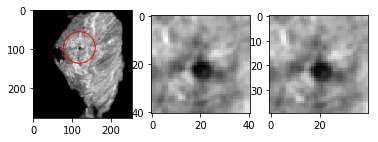

20 254 234 0
label: 2
x: 254, y: 139, z: 33


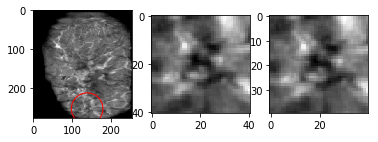

20 65 45 0
label: 2
x: 65, y: 215, z: 32


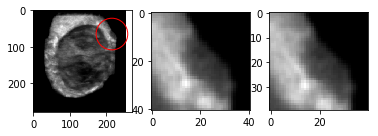

20 80 60 0
label: 2
x: 80, y: 180, z: 14


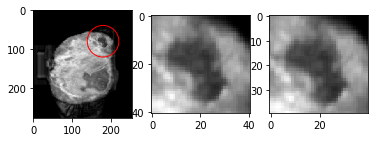

20 105 85 0
label: 21
x: 105, y: 119, z: 15


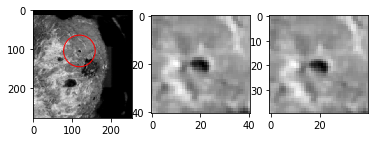

20 150 130 0
label: 2
x: 150, y: 129, z: 23


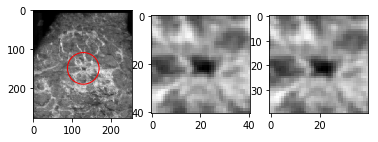

20 118 98 0
label: 2
x: 118, y: 160, z: 24


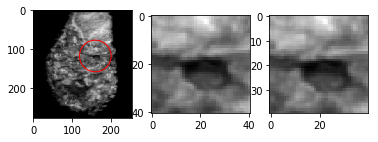

20 111 91 0
label: 2
x: 111, y: 92, z: 24


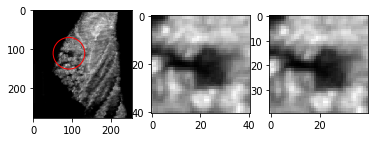

20 100 80 0
label: 2
x: 100, y: 211, z: 23


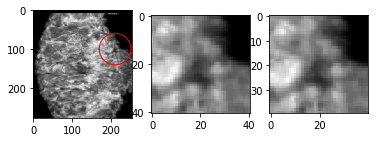

20 129 109 0
label: 2
x: 129, y: 178, z: 14


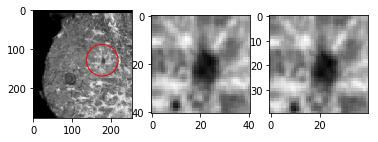

20 98 78 0
label: 2
x: 98, y: 214, z: 23


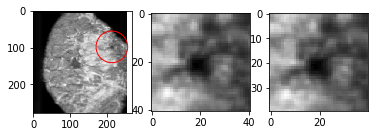

20 95 75 0
label: 2
x: 95, y: 116, z: 14


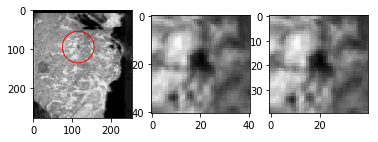

20 95 75 0
label: 2
x: 95, y: 148, z: 23


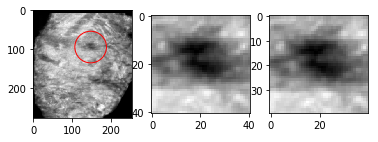

20 214 194 0
label: 2
x: 214, y: 109, z: 19


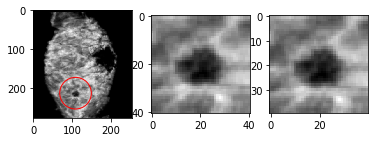

20 144 124 0
label: 2
x: 144, y: 61, z: 24


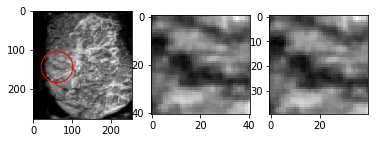

20 123 103 0
label: 2
x: 123, y: 138, z: 21


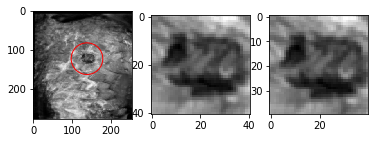

20 192 172 0
label: 2
x: 192, y: 114, z: 8


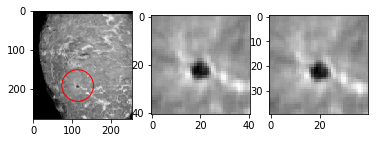

20 73 53 0
label: 21
x: 73, y: 193, z: 28


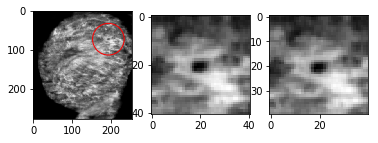

20 204 184 0
label: 2
x: 204, y: 139, z: 19


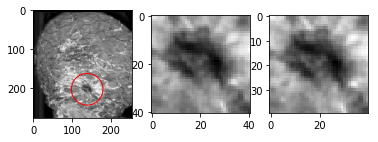

20 59 39 0
label: 2
x: 59, y: 157, z: 15


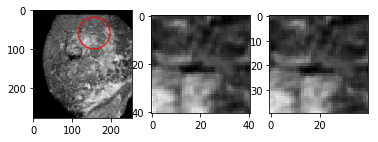

20 143 123 0
label: 2
x: 143, y: 123, z: 18


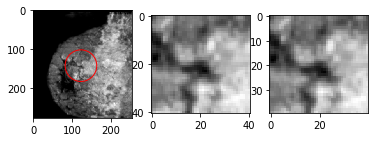

20 162 142 0
label: 2
x: 162, y: 227, z: 18


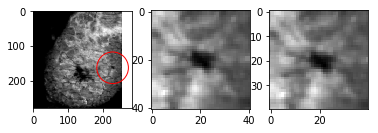

20 141 121 0
label: 2
x: 141, y: 105, z: 18


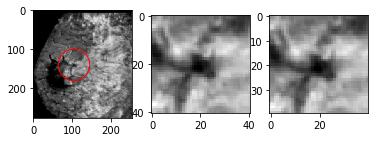

20 154 134 0
label: 21
x: 154, y: 102, z: 15


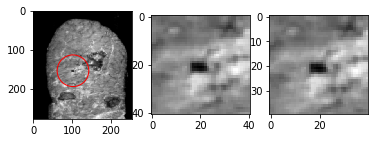

20 229 209 0
label: 20
x: 229, y: 124, z: 16


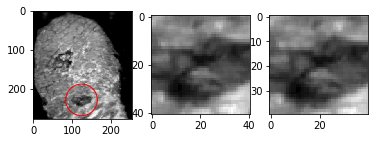

20 224 204 0
label: 20
x: 224, y: 124, z: 16


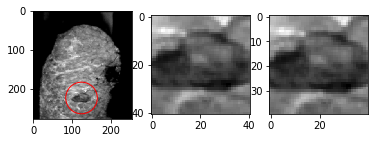

20 123 103 0
label: 2
x: 123, y: 174, z: 25


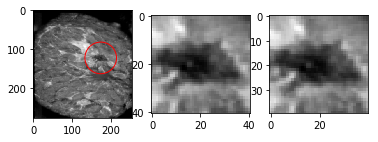

20 100 80 0
label: 2
x: 100, y: 11, z: 29


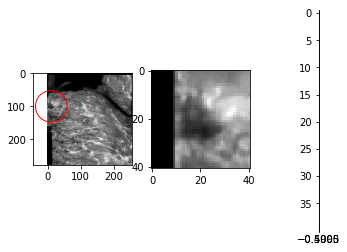

20 161 141 0
label: 2
x: 161, y: 77, z: 14


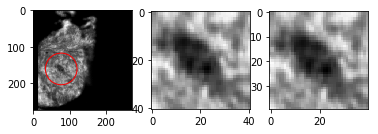

20 94 74 0
label: 2
x: 94, y: 112, z: 35


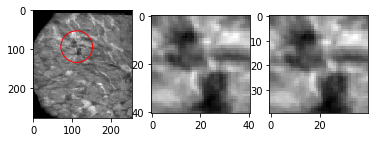

20 141 121 0
label: 2
x: 141, y: 91, z: 31


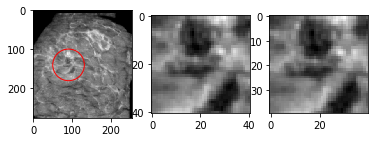

20 149 129 0
label: 2
x: 149, y: 213, z: 26


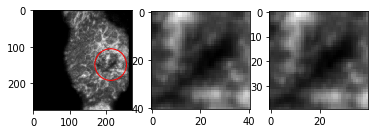

20 97 77 0
label: 2
x: 97, y: 188, z: 27


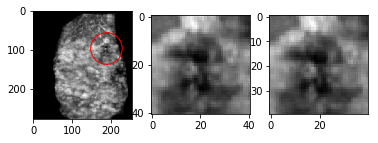

20 20 0 0
label: 2
x: 20, y: 167, z: 25


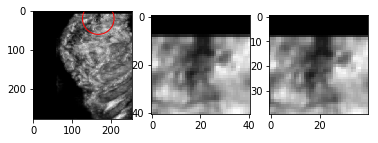

20 98 78 0
label: 21
x: 98, y: 149, z: 15


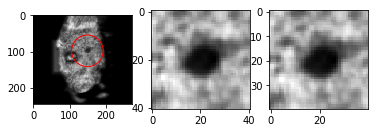

20 80 60 0
label: 21
x: 80, y: 152, z: 28


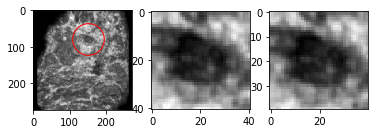

20 200 180 0
label: 21
x: 200, y: 81, z: 24


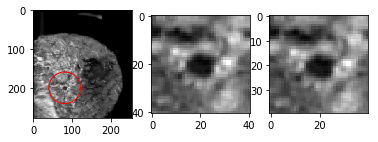

20 107 87 0
label: 2
x: 107, y: 19, z: 44


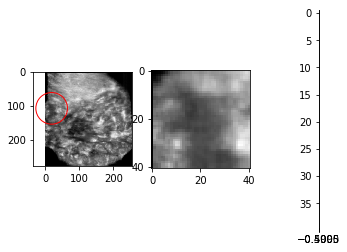

20 81 61 0
label: 21
x: 81, y: 127, z: 31


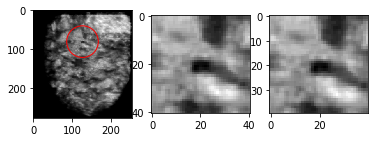

20 86 66 0
label: 2
x: 86, y: 122, z: 45


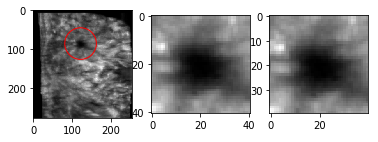

20 138 118 0
label: 2
x: 138, y: 71, z: 45


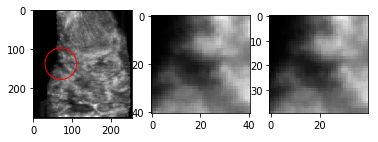

20 123 103 0
label: 2
x: 123, y: 115, z: 22


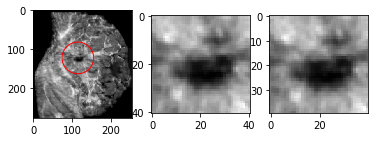

20 110 90 0
label: 2
x: 110, y: 173, z: 43


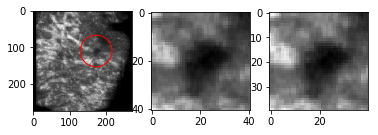

20 148 128 0
label: 2
x: 148, y: 65, z: 38


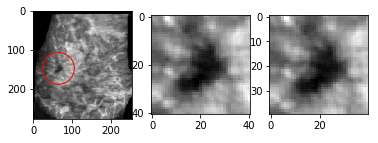

20 147 127 0
label: 2
x: 147, y: 151, z: 34


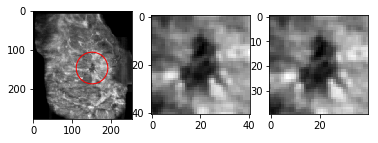

20 79 59 0
label: 2
x: 79, y: 130, z: 49


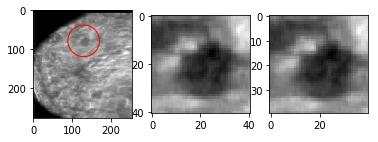

20 96 76 0
label: 2
x: 96, y: 123, z: 46


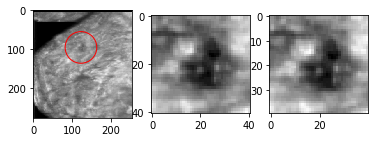

20 79 59 0
label: 2
x: 79, y: 109, z: 34


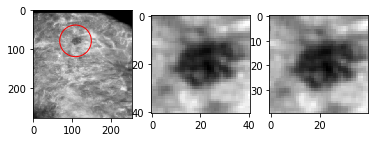

20 159 139 0
label: 2
x: 159, y: 156, z: 27


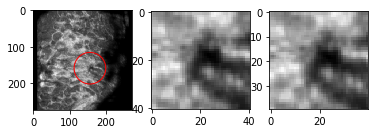

20 211 191 0
label: 2
x: 211, y: 232, z: 21


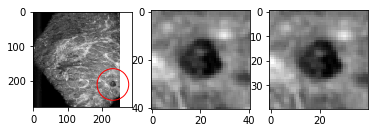

20 194 174 0
label: 2
x: 194, y: 153, z: 21


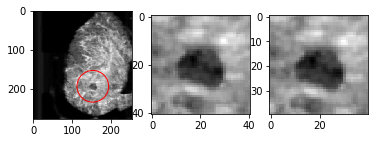

20 126 106 0
label: 2
x: 126, y: 216, z: 28


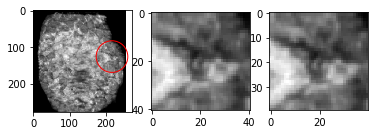

20 106 86 0
label: 2
x: 106, y: 108, z: 26


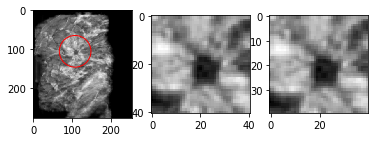

20 197 177 0
label: 2
x: 197, y: 96, z: 23


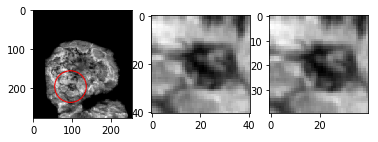

20 205 185 0
label: 2
x: 205, y: 109, z: 23


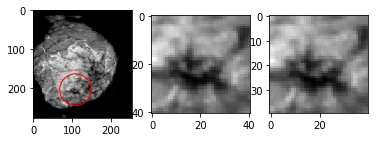

20 55 35 0
label: 21
x: 55, y: 59, z: 19


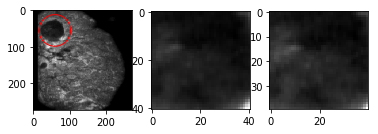

20 163 143 0
label: 21
x: 163, y: 216, z: 25


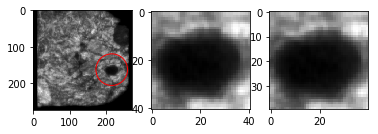

20 130 110 0
label: 2
x: 130, y: 90, z: 43


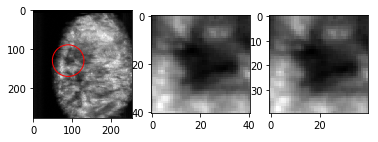

20 111 91 0
label: 2
x: 111, y: 127, z: 31


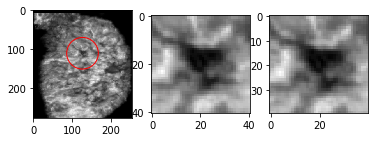

20 151 131 0
label: 20
x: 151, y: 155, z: 30


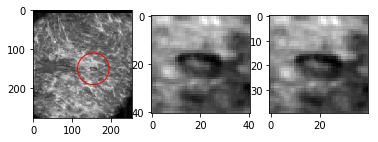

20 117 97 0
label: 2
x: 117, y: 114, z: 8


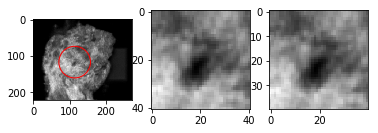

20 194 174 0
label: 2
x: 194, y: 57, z: 11


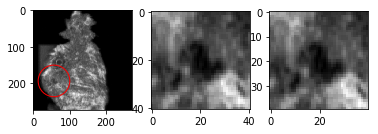

20 151 131 0
label: 2
x: 151, y: 42, z: 20


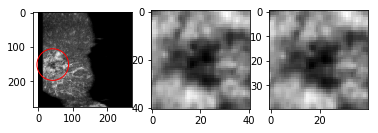

20 221 201 0
label: 20
x: 221, y: 98, z: 20


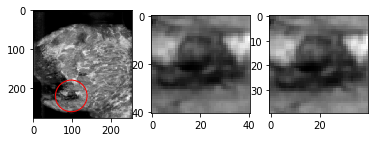

20 221 201 0
label: 20
x: 221, y: 190, z: 15


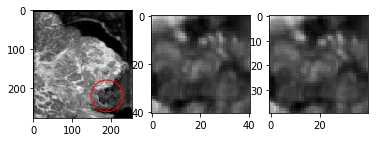

20 37 17 0
label: 2
x: 37, y: 142, z: 44


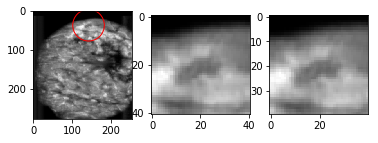

20 37 17 0
label: 2
x: 37, y: 28, z: 40


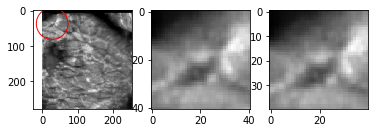

20 82 62 0
label: 2
x: 82, y: 225, z: 32


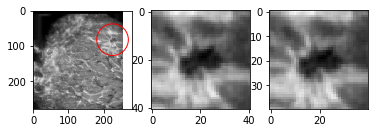

20 61 41 0
label: 2
x: 61, y: 187, z: 51


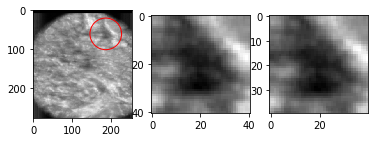

20 60 40 0
label: 2
x: 60, y: 97, z: 51


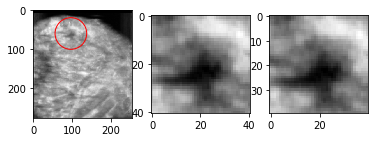

20 64 44 0
label: 2
x: 64, y: 101, z: 29


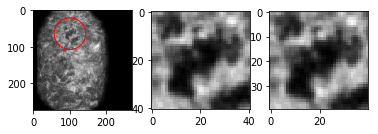

20 74 54 0
label: 2
x: 74, y: 165, z: 29


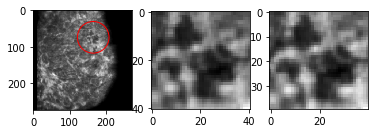

20 136 116 0
label: 2
x: 136, y: 103, z: 33


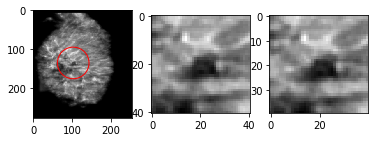

20 132 112 0
label: 2
x: 132, y: 177, z: 36


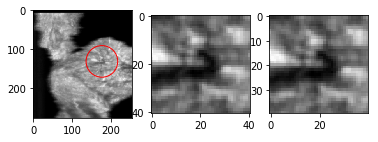

20 177 157 0
label: 2
x: 177, y: 61, z: 33


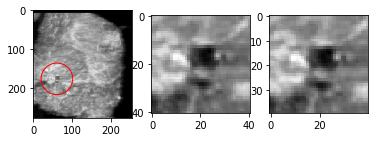

20 135 115 0
label: 2
x: 135, y: 143, z: 33


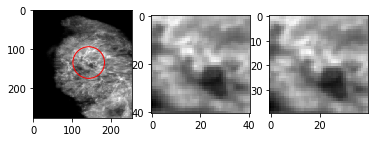

20 134 114 0
label: 2
x: 134, y: 132, z: 32


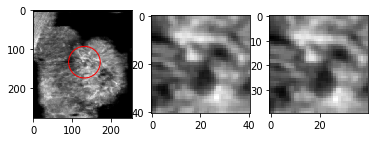

20 137 117 0
label: 2
x: 137, y: 86, z: 33


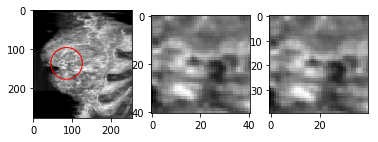

20 156 136 0
label: 2
x: 156, y: 131, z: 33


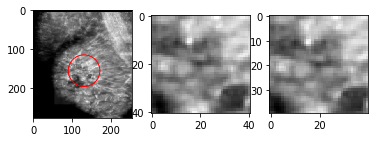

20 131 111 0
label: 21
x: 131, y: 176, z: 14


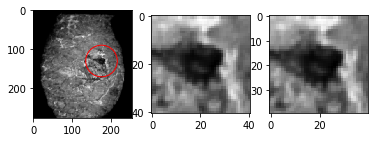

20 211 191 0
label: 21
x: 211, y: 70, z: 30


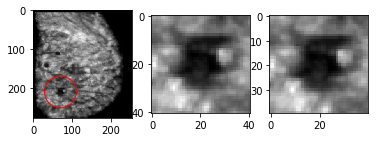

20 120 100 0
label: 21
x: 120, y: 85, z: 28


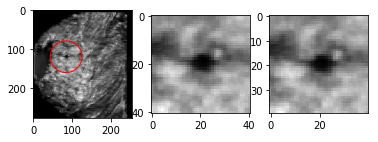

20 90 70 0
label: 21
x: 90, y: 192, z: 32


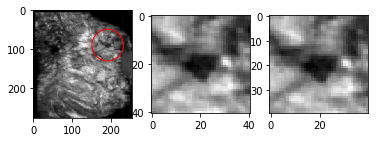

20 157 137 0
label: 21
x: 157, y: 142, z: 22


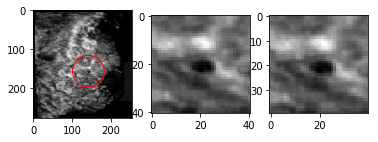

20 155 135 0
label: 21
x: 155, y: 174, z: 20


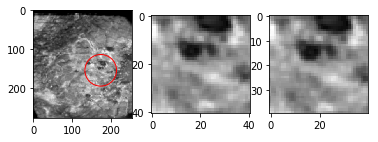

20 127 107 0
label: 21
x: 127, y: 34, z: 29


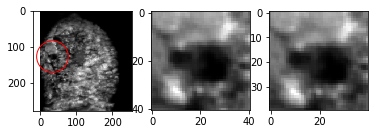

20 135 115 0
label: 21
x: 135, y: 165, z: 20


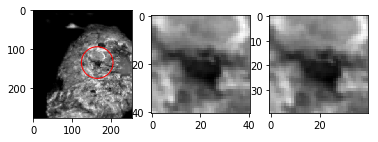

20 136 116 0
label: 21
x: 136, y: 220, z: 36


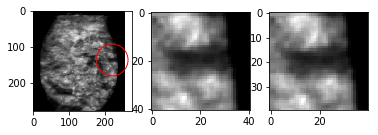

20 107 87 0
label: 21
x: 107, y: 62, z: 32


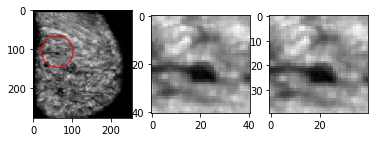

20 115 95 0
label: 21
x: 115, y: 83, z: 24


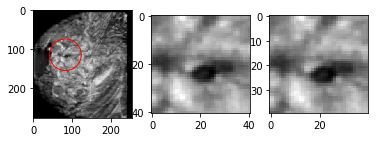

20 88 68 0
label: 21
x: 88, y: 193, z: 30


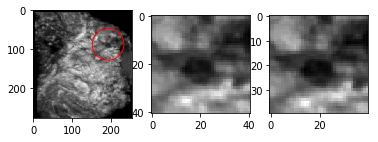

20 82 62 0
label: 21
x: 82, y: 44, z: 10


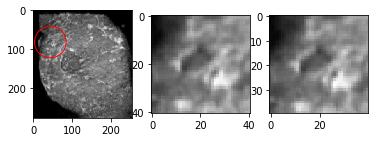

20 90 70 0
label: 21
x: 90, y: 124, z: 28


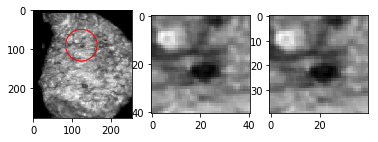

20 221 201 0
label: 21
x: 221, y: 172, z: 28


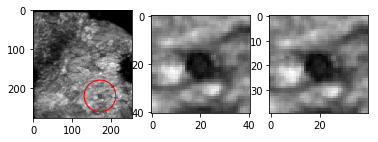

20 163 143 0
label: 21
x: 163, y: 103, z: 18


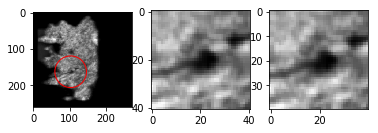

20 128 108 0
label: 2
x: 128, y: 57, z: 25


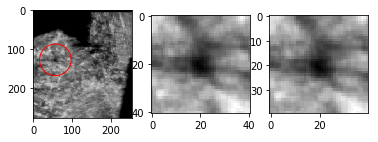

20 237 217 0
label: 2
x: 237, y: 138, z: 40


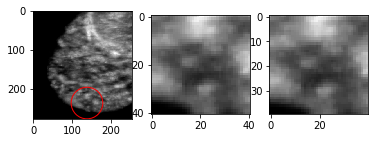

20 88 68 0
label: 2
x: 88, y: 205, z: 19


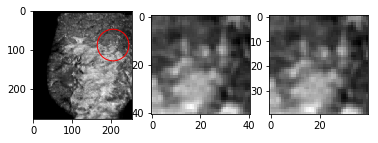

20 104 84 0
label: 21
x: 104, y: 174, z: 25


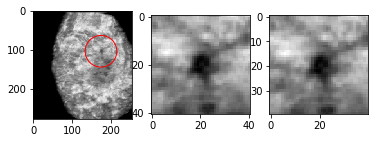

20 70 50 0
label: 2
x: 70, y: 131, z: 30


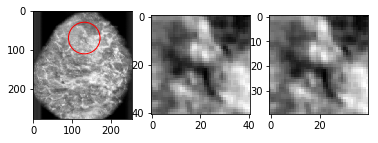

20 64 44 0
label: 2
x: 64, y: 69, z: 30


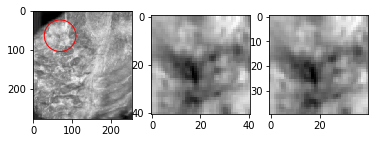

20 111 91 0
label: 2
x: 111, y: 187, z: 24


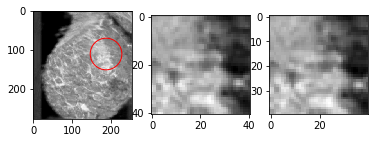

20 77 57 0
label: 2
x: 77, y: 113, z: 33


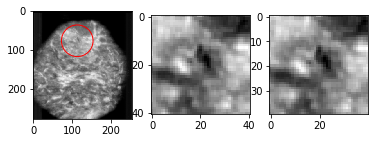

20 52 32 0
label: 2
x: 52, y: 42, z: 36


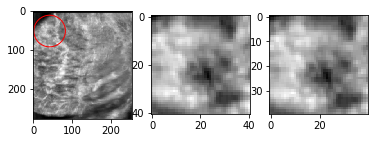

20 105 85 0
label: 2
x: 105, y: 184, z: 30


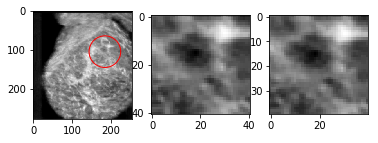

20 74 54 0
label: 2
x: 74, y: 133, z: 30


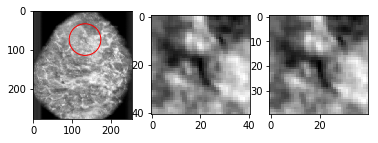

20 69 49 0
label: 2
x: 69, y: 78, z: 30


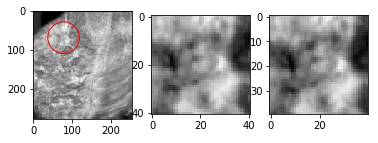

20 102 82 0
label: 2
x: 102, y: 181, z: 30


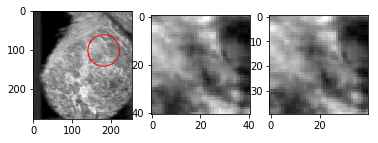

20 89 69 0
label: 2
x: 89, y: 121, z: 18


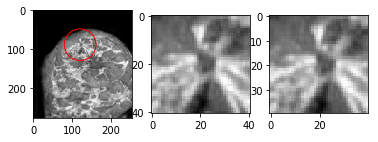

20 77 57 0
label: 2
x: 77, y: 191, z: 15


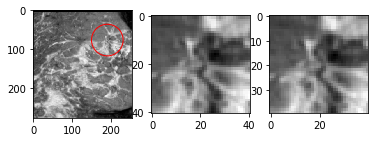

20 196 176 0
label: 2
x: 196, y: 102, z: 15


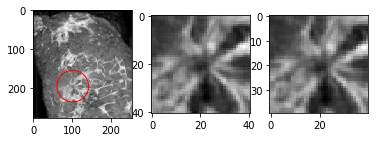

20 157 137 0
label: 2
x: 157, y: 124, z: 41


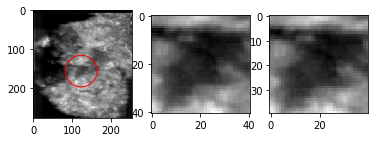

20 130 110 0
label: 2
x: 130, y: 130, z: 55


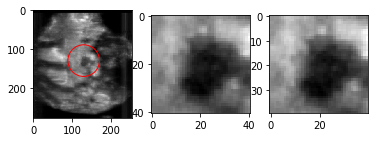

20 79 59 0
label: 21
x: 79, y: 125, z: 9


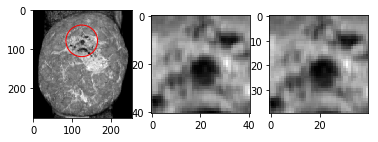

20 138 118 0
label: 21
x: 138, y: 166, z: 33


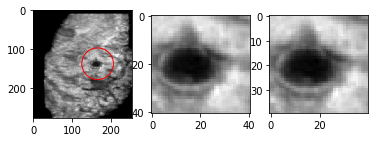

20 169 149 0
label: 21
x: 169, y: 54, z: 39


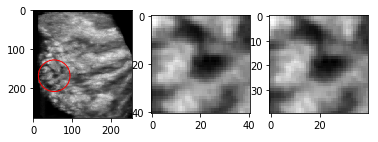

20 163 143 0
label: 21
x: 163, y: 168, z: 18


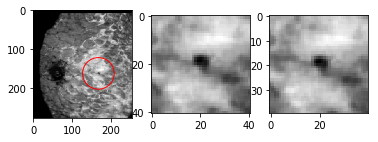

20 145 125 0
label: 21
x: 145, y: 106, z: 22


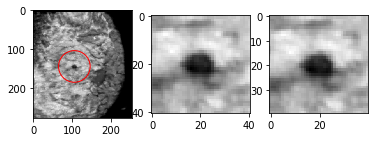

20 113 93 0
label: 21
x: 113, y: 162, z: 33


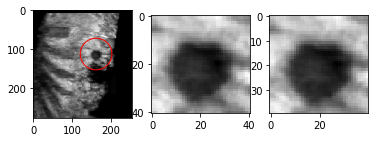

20 77 57 0
label: 2
x: 77, y: 66, z: 37


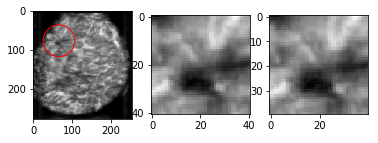

20 83 63 0
label: 2
x: 83, y: 188, z: 25


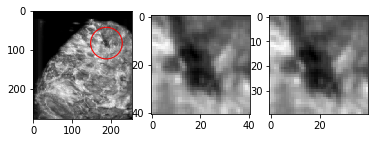

20 85 65 0
label: 21
x: 85, y: 132, z: 11


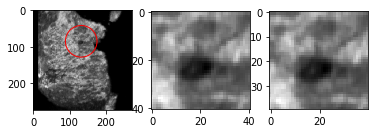

20 213 193 0
label: 20
x: 213, y: 87, z: 16


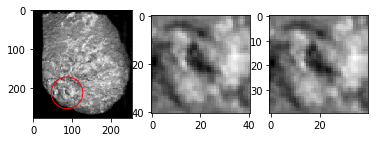

20 223 203 0
label: 20
x: 223, y: 61, z: 19


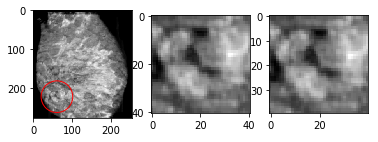

20 197 177 0
label: 20
x: 197, y: 197, z: 19


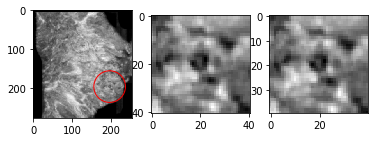

20 219 199 0
label: 20
x: 219, y: 58, z: 22


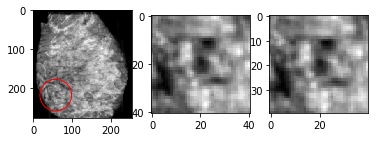

20 195 175 0
label: 20
x: 195, y: 195, z: 19


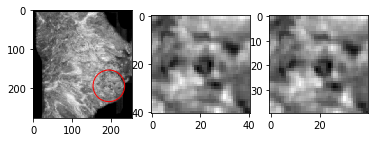

20 210 190 0
label: 20
x: 210, y: 154, z: 16


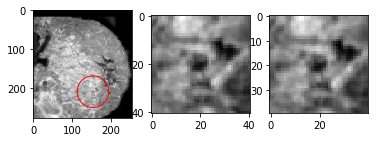

20 176 156 0
label: 20
x: 176, y: 147, z: 10


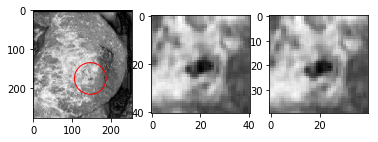

20 20 0 0
label: 20
x: 20, y: 105, z: 16


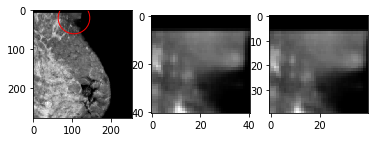

20 183 163 0
label: 20
x: 183, y: 149, z: 10


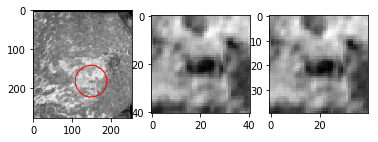

20 184 164 0
label: 20
x: 184, y: 150, z: 10


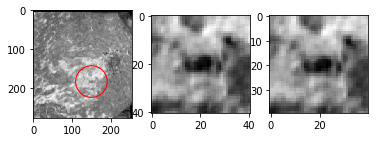

20 205 185 0
label: 2
x: 205, y: 123, z: 29


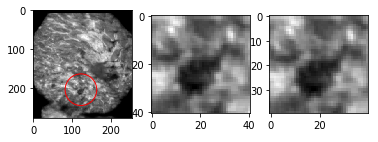

20 249 229 0
label: 2
x: 249, y: 127, z: 37


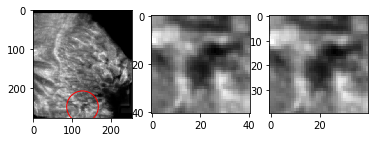

20 80 60 0
label: 21
x: 80, y: 150, z: 39


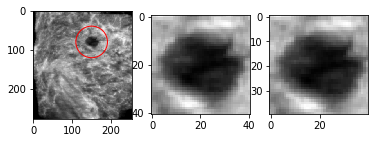

20 21 1 0
label: 2
x: 21, y: 65, z: 20


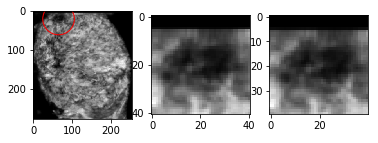

20 75 55 0
label: 2
x: 75, y: 160, z: 26


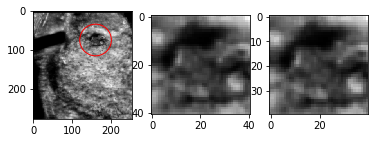

20 74 54 0
label: 2
x: 74, y: 68, z: 26


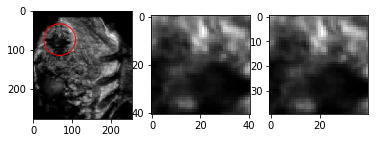

20 113 93 0
label: 2
x: 113, y: 74, z: 20


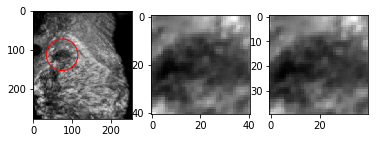

20 126 106 0
label: 2
x: 126, y: 108, z: 24


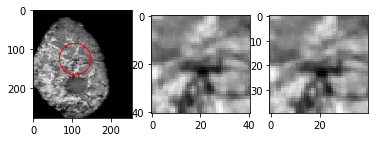

20 114 94 0
label: 2
x: 114, y: 207, z: 32


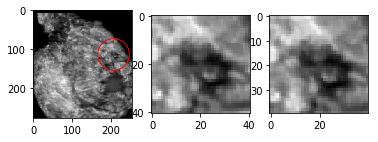

20 160 140 0
label: 2
x: 160, y: 103, z: 28


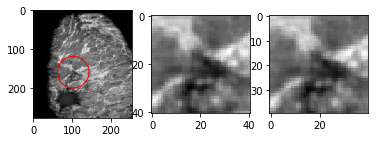

20 137 117 0
label: 21
x: 137, y: 185, z: 15


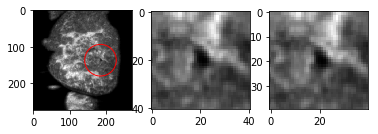

20 60 40 0
label: 2
x: 60, y: 145, z: 46


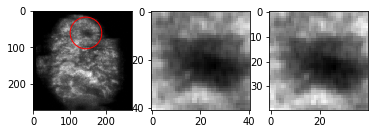

20 122 102 0
label: 2
x: 122, y: 78, z: 23


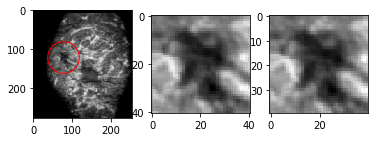

20 115 95 0
label: 2
x: 115, y: 161, z: 22


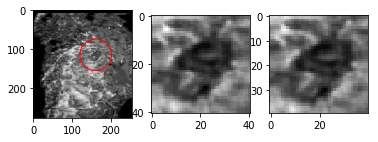

20 94 74 0
label: 21
x: 94, y: 114, z: 7


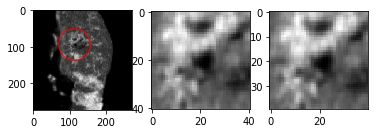

20 153 133 0
label: 2
x: 153, y: 146, z: 28


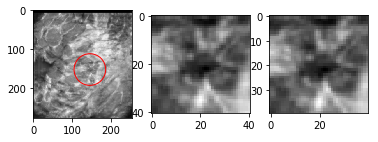

20 153 133 0
label: 2
x: 153, y: 145, z: 29


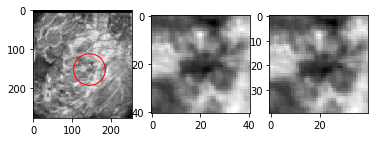

20 116 96 0
label: 2
x: 116, y: 167, z: 30


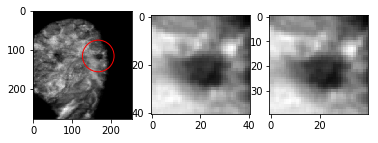

20 209 189 0
label: 20
x: 209, y: 194, z: 20


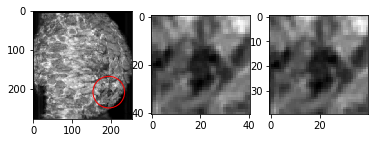

20 193 173 0
label: 20
x: 193, y: 142, z: 12


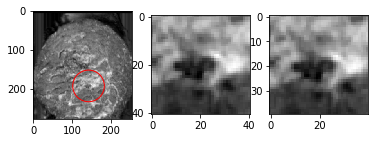

20 155 135 0
label: 21
x: 155, y: 123, z: 15


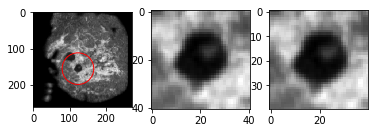

20 90 70 0
label: 2
x: 90, y: 113, z: 18


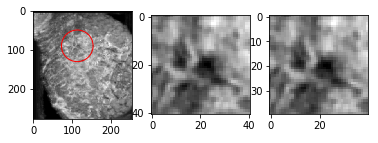

20 86 66 0
label: 2
x: 86, y: 154, z: 24


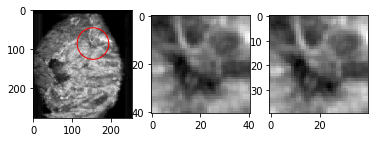

20 107 87 0
label: 2
x: 107, y: 112, z: 24


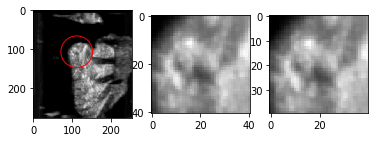

20 166 146 0
label: 2
x: 166, y: 155, z: 24


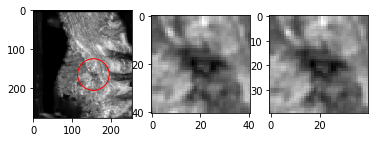

20 47 27 0
label: 21
x: 47, y: 194, z: 18


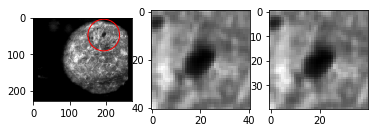

20 143 123 0
label: 20
x: 143, y: 191, z: 28


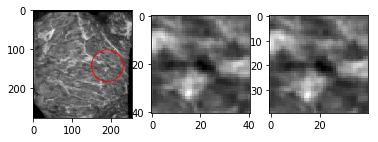

20 103 83 0
label: 21
x: 103, y: 137, z: 12


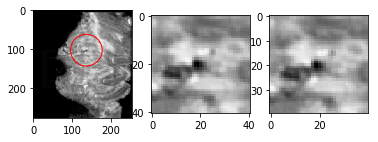

20 104 84 0
label: 20
x: 104, y: 89, z: 37


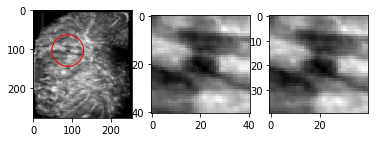

20 66 46 0
label: 20
x: 66, y: 78, z: 36


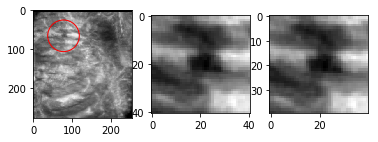

20 83 63 0
label: 20
x: 83, y: 148, z: 37


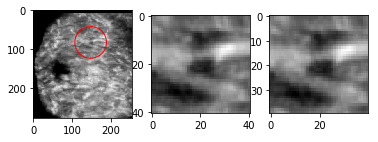

20 116 96 0
label: 21
x: 116, y: 54, z: 36


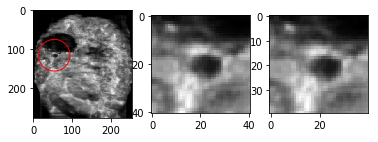

20 111 91 0
label: 21
x: 111, y: 148, z: 20


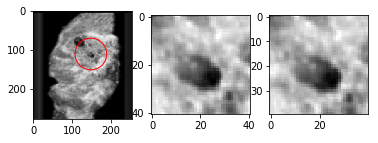

20 65 45 0
label: 21
x: 65, y: 88, z: 14


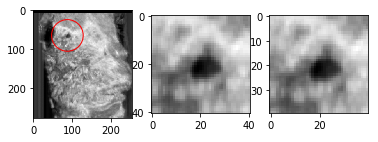

20 90 70 0
label: 20
x: 90, y: 112, z: 10


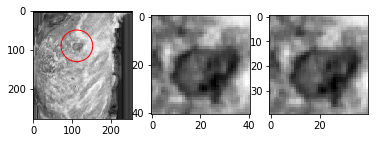

20 30 10 0
label: 21
x: 30, y: 159, z: 12


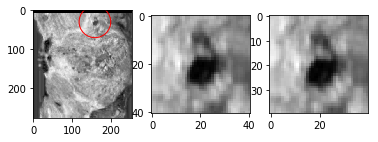

20 120 100 0
label: 21
x: 120, y: 180, z: 22


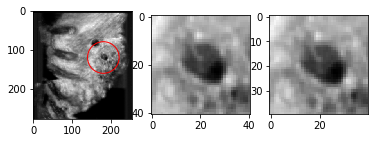

20 83 63 0
label: 21
x: 83, y: 70, z: 16


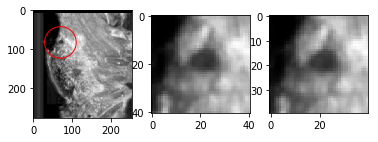

20 112 92 0
label: 21
x: 112, y: 146, z: 20


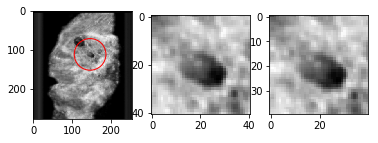

20 64 44 0
label: 21
x: 64, y: 89, z: 12


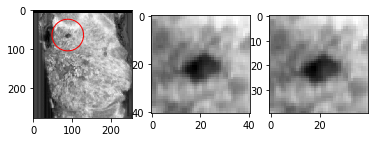

20 91 71 0
label: 20
x: 91, y: 113, z: 10


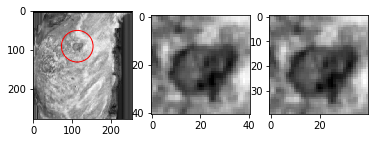

20 30 10 0
label: 21
x: 30, y: 163, z: 14


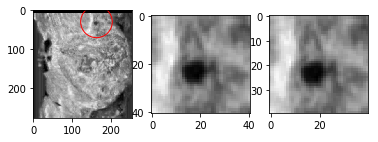

20 118 98 0
label: 21
x: 118, y: 180, z: 22


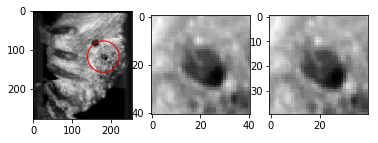

20 80 60 0
label: 21
x: 80, y: 70, z: 14


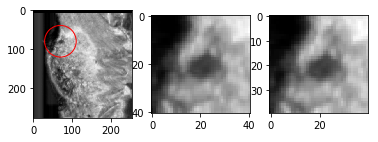

20 122 102 0
label: 2
x: 122, y: 110, z: 43


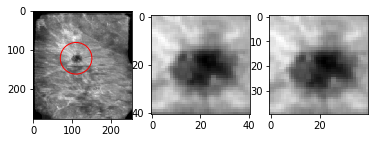

20 232 212 0
label: 2
x: 232, y: 159, z: 47


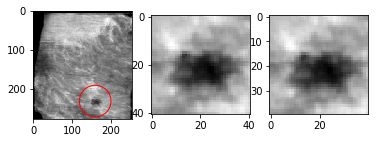

20 75 55 0
label: 20
x: 75, y: 166, z: 32


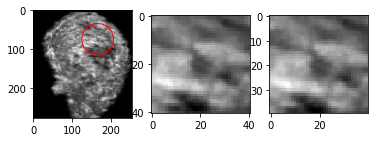

20 140 120 0
label: 20
x: 140, y: 181, z: 34


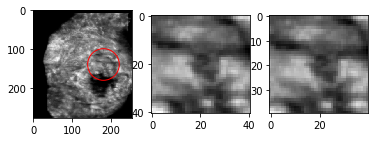

20 142 122 0
label: 20
x: 142, y: 182, z: 34


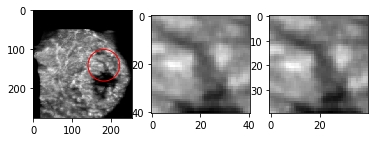

20 97 77 0
label: 2
x: 97, y: 107, z: 28


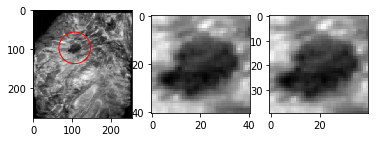

20 207 187 0
label: 20
x: 207, y: 154, z: 35


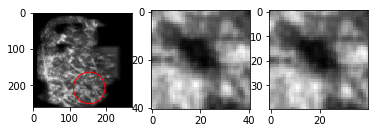

20 120 100 0
label: 20
x: 120, y: 107, z: 18


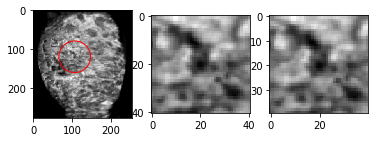

20 144 124 0
label: 20
x: 144, y: 117, z: 22


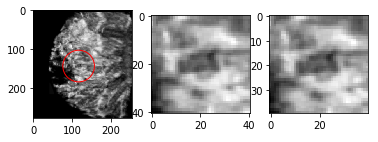

20 182 162 0
label: 2
x: 182, y: 192, z: 27


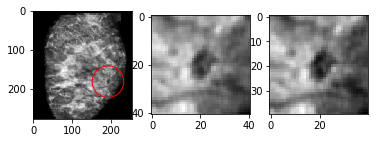

20 165 145 0
label: 2
x: 165, y: 119, z: 18


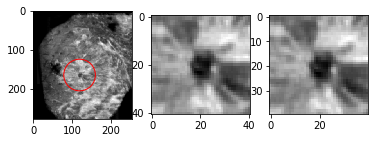

20 128 108 0
label: 2
x: 128, y: 105, z: 35


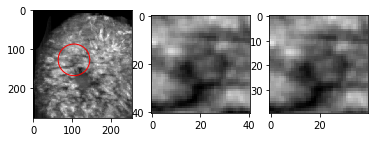

20 135 115 0
label: 2
x: 135, y: 147, z: 39


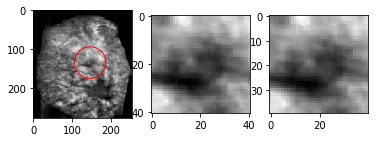

20 91 71 0
label: 21
x: 91, y: 186, z: 13


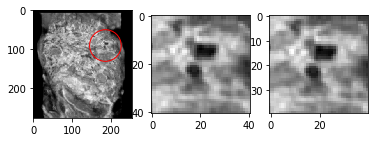

20 124 104 0
label: 21
x: 124, y: 101, z: 22


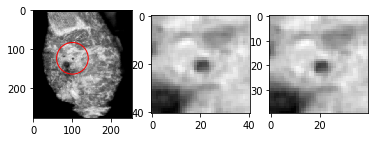

20 149 129 0
label: 2
x: 149, y: 144, z: 44


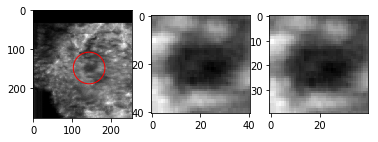

20 136 116 0
label: 2
x: 136, y: 98, z: 22


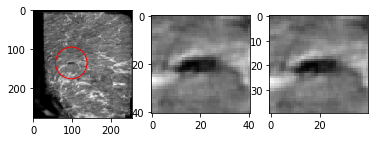

20 168 148 0
label: 21
x: 168, y: 47, z: 14


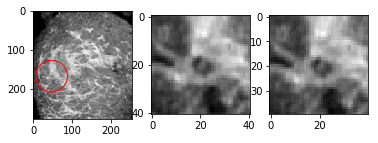

20 78 58 0
label: 20
x: 78, y: 111, z: 27


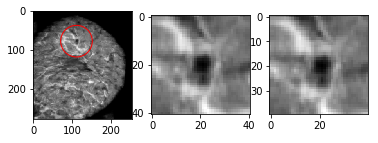

20 70 50 0
label: 20
x: 70, y: 206, z: 33


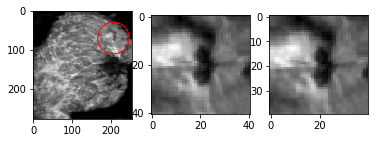

20 94 74 0
label: 21
x: 94, y: 144, z: 40


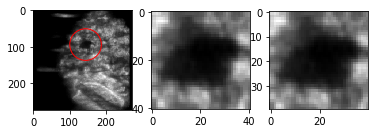

20 157 137 0
label: 2
x: 157, y: 222, z: 20


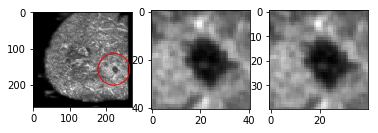

20 182 162 0
label: 2
x: 182, y: 123, z: 43


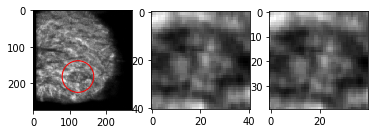

20 158 138 0
label: 2
x: 158, y: 111, z: 20


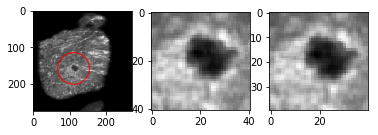

20 101 81 0
label: 21
x: 101, y: 98, z: 36


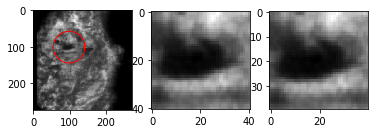

20 142 122 0
label: 20
x: 142, y: 189, z: 24


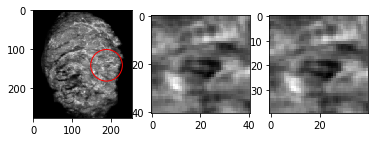

20 165 145 0
label: 20
x: 165, y: 133, z: 27


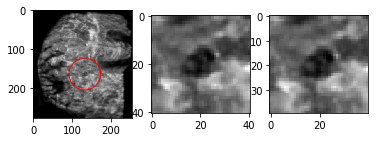

20 138 118 0
label: 21
x: 138, y: 124, z: 10


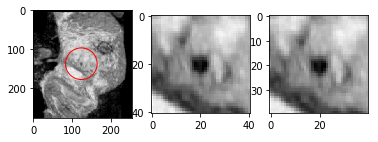

20 127 107 0
label: 21
x: 127, y: 136, z: 12


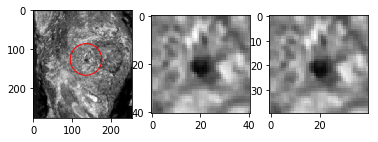

20 159 139 0
label: 21
x: 159, y: 90, z: 12


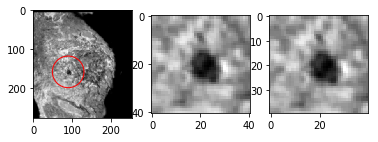

20 103 83 0
label: 2
x: 103, y: 91, z: 18


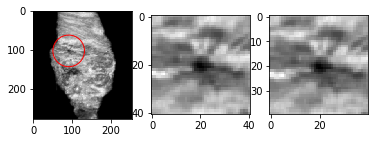

20 92 72 0
label: 2
x: 92, y: 193, z: 20


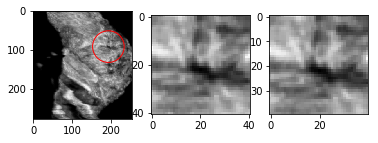

20 125 105 0
label: 2
x: 125, y: 83, z: 20


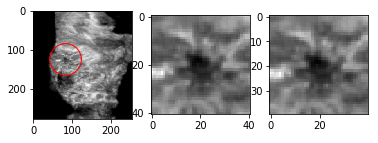

20 56 36 0
label: 2
x: 56, y: 161, z: 9


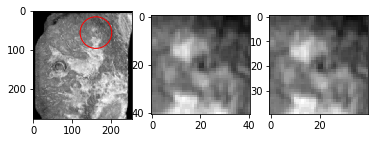

In [115]:
# hist = ['2', '20', '21']
# ranges = [3, 5, 7, 9, 11, 13]
# histlist = [[] for rang in ranges]
# histboxlist = [[] for rang in ranges]
# histinnerlist = [[] for rang in ranges]
# for i in tqdm(range(csv.shape[0])):
#     pID = csv.iloc[i, :].patientID
#     sID = csv.iloc[i, :].studyID
#     scN = csv.iloc[i, :].scanName
#     y, x, z = csv.iloc[i, :][['annotationLowResolution{}'.format(i) for i in range(1, 4)]].values.astype(np.uint8)
#     img = load_image(pID, sID, scN, datadir='../')
#     for r in range(6):
#         avg = np.mean(img[..., z])+r/30.
#         patch = np.squeeze(get_patch(img, (y, x, z), 3))
# #     bigpatch = np.squeeze(get_patch(img, (y, x, z), 39))
# #     histlist[hist.index(csv.iloc[i, :].histology)==2].append(img[x,y,z])
#         if csv.iloc[i, :].histology == '21':
#             histboxlist[r].append(np.mean(patch>avg))
#         else:
#             histlist[r].append(np.mean(patch>avg))
# #     histinnerlist[hist.index(csv.iloc[i, :].histology)==2].append(np.mean(img[x, y, z]) - np.mean(img[..., z]))
    
val_csv = csv.loc[csv['patientID'].isin(unique_patients), :]
for i in range(csv.shape[0]):
    pID = csv.iloc[i, :].patientID
    sID = csv.iloc[i, :].studyID
    scN = csv.iloc[i, :].scanName
    y, x, z = csv.iloc[i, :][['annotationLowResolution{}'.format(i) for i in range(1, 4)]].values.astype(np.uint8)
    img = load_image(pID, sID, scN, datadir='/projects/0/ismi2018/FINALPROJECTS/BREAST_3D_ULTRASOUND/shareWithStudents/')
    patch = np.squeeze(test_get_patch(img, (y, x, z), 41, False))

    # Show full image
    print('label: {}'.format(val_csv.iloc[i, :].histology))
    print('x: {}, y: {}, z: {}'.format(x,y,z))
    
    plt.figure()
    plt.subplot(131)
    plt.imshow(img[..., z], cmap='gray')
    plt.scatter(y, x, edgecolors='r', facecolors='none', s=1000)

    # Show patch
    plt.subplot(132)
    znew=z
    if z>20:
        znew = patch.shape[-1]
    plt.imshow(patch[..., 20], cmap='gray')
#     print('Predicted: {}'.format(y_pred[i]))

    plt.subplot(133)
    plt.imshow(img[x-20:x+20, y-20:y+20, z], cmap='gray')
    if i==4:
        for j in range(patch.shape[-1]):
            plt.figure()
            plt.subplot(121)
            plt.imshow(patch[..., j], cmap='gray')
            plt.subplot(122)
            plt.imshow(img[x-20:x+20, y-20:y+20, z], cmap='gray')
            plt.show()
    plt.show()
          

In [ ]:
boxplot(histboxlist)

In [ ]:
boxplot(histlist)

In [ ]:
histnewlist = np.array([np.mean(his) for his in histlist])

In [ ]:
print(histnewboxlist - histnewlist)

In [ ]:
lst = np.arange(9)

In [ ]:
print(np.mean(lst>2))

In [ ]:
for i in range(csv.shape[0]):
    pID = csv.iloc[i, :].patientID
    sID = csv.iloc[i, :].studyID
    scN = csv.iloc[i, :].scanName
    y, x, z = csv.iloc[i, :][['annotationLowResolution{}'.format(i) for i in range(1, 4)]].values.astype(np.uint8)
    img = load_image(pID, sID, scN, datadir='../')
    patch = np.squeeze(get_patch(img, (y, x, z), 41))

    if csv.iloc[i, :].histology=='21':
        # Show full image
        print('label: {}'.format(csv.iloc[i, :].histology))
        print('x: {}, y: {}, z: {}'.format(x,y,z))

        plt.figure()
        plt.subplot(131)
        plt.imshow(img[..., z], cmap='gray')
        plt.scatter(y, x, edgecolors='r', facecolors='none', s=1000)

        # Show patch
        plt.subplot(132)
        znew=z
        if z>20:
            znew = patch.shape[-1]//2
        plt.imshow(patch[..., patch.shape[-1]//2], cmap='gray')
    #     print('Predicted: {}'.format(y_pred[i]))

        plt.subplot(133)
        plt.imshow(img[x-20:x+20, y-20:y+20, z], cmap='gray')

        plt.show()

In [ ]:
import keras
import tensorflow as tf

keras.__version__